In [ ]:
# Instalación de dependencias
!pip install numpy scipy matplotlib seaborn scikit-learn mesa -q

# Imports
from mesa import Agent, Model
from mesa.space import MultiGrid
from mesa.datacollection import DataCollector
from mesa.batchrunner import batch_run
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.colors import ListedColormap
import matplotlib.patches as patches
from matplotlib.patches import Patch
from IPython.display import HTML
plt.rcParams["animation.html"] = "jshtml"
matplotlib.rcParams['animation.embed_limit'] = 2**128
import numpy as np
import pandas as pd
import seaborn as sns
import random
import copy
sns.set()

# Configuración del mapa
bits = [
    ["00110","00100","00100","00100","01103","00113","01103","01113"],
    ["10010","10000","10000","10003","11000","10010","11000","11010"],
    ["00110","01100","00110","00103","00100","01103","00113","01100"],
    ["00010","01003","10013","10000","10000","11000","10010","11003"],
    ["00010","00000","01100","00110","01103","00113","00100","01103"],
    ["10010","10000","11003","10013","11000","10010","10000","11000"],
]

def decode(cell):
    if cell[4] == "3":
        estado = "cerrado"
    elif cell[4] == "4":
        estado = "abierto"
    else:
        estado = "sin_puerta"

    return {
        "up": cell[0] == "1",
        "right": cell[1] == "1",
        "down": cell[2] == "1",
        "left": cell[3] == "1",
        "vida": 2,
        "puerta": estado
    }

def can_move(model, x, y, nx, ny):
    if not (0 <= nx < model.grid.width and 0 <= ny < model.grid.height):
        return False

    cell = model.walls[y][x]
    next_cell = model.walls[ny][nx]

    dx = nx - x
    dy = ny - y

    if dy == 1:
        if cell["puerta"] == "cerrado" and cell["up"]:
            return "puerta_cerrada"
        if not cell["up"] or cell["vida"] <= 0:
            return True
        if cell["puerta"] in ["abierto", "sin_puerta"] and not cell["up"]:
            return True
        return False

    if dy == -1:
        if cell["puerta"] == "cerrado" and cell["down"]:
            return "puerta_cerrada"
        if not cell["down"] or cell["vida"] <= 0:
            return True
        if cell["puerta"] in ["abierto", "sin_puerta"] and not cell["down"]:
            return True
        return False

    if dx == 1:
        if cell["puerta"] == "cerrado" and cell["right"]:
            return "puerta_cerrada"
        if not cell["right"] or cell["vida"] <= 0:
            return True
        if cell["puerta"] in ["abierto", "sin_puerta"] and not cell["right"]:
            return True
        return False

    if dx == -1:
        if cell["puerta"] == "cerrado" and cell["left"]:
            return "puerta_cerrada"
        if not cell["left"] or cell["vida"] <= 0:
            return True
        if cell["puerta"] in ["abierto", "sin_puerta"] and not cell["left"]:
            return True
        return False

    return False

def get_door_direction(x, y, nx, ny):
    dx = nx - x
    dy = ny - y

    if dy == 1:
        return "up"
    elif dy == -1:
        return "down"
    elif dx == 1:
        return "right"
    elif dx == -1:
        return "left"
    return None



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [33]:
class Cascanueces(Agent):
    def __init__(self, model, base_pos):
        super().__init__(model)
        self.carrying = False
        self.PA = 4
        self.MAX_PA = 4
        self.PA_guardados = 0
        self.squares_visited = 0
        self.fuegos_apagados = 0
        self.humos_apagados = 0
        self.puertas_abiertas = 0
        self.base_pos = base_pos
        self.victimas_salvadas = 0
        self.veces_afectado_explosion = 0

    def reset_pa(self):
        self.PA = self.MAX_PA + self.PA_guardados
        self.PA_guardados = 0
        
    def guardar_pa_no_usados(self):
        if self.PA > 0:
            self.PA_guardados = min(self.PA, 4)
        else:
            self.PA_guardados = 0

    def regresar_a_base(self):
        self.model.grid.move_agent(self, self.base_pos)
        if self.carrying:
            self.carrying = False
        self.veces_afectado_explosion += 1

    def open_door(self, direction):
        if self.PA >= 1:
            x, y = self.pos
            cell = self.model.walls[y][x]

            if cell[direction] and cell["puerta"] == "cerrado":
                self.model.walls[y][x]["puerta"] = "abierto"
                self.PA -= 1
                self.puertas_abiertas += 1

                if direction == "up" and y + 1 < self.model.grid.height:
                    next_cell = self.model.walls[y + 1][x]
                    if next_cell["down"] and next_cell["puerta"] == "cerrado":
                        self.model.walls[y + 1][x]["puerta"] = "abierto"
                elif direction == "down" and y - 1 >= 0:
                    next_cell = self.model.walls[y - 1][x]
                    if next_cell["up"] and next_cell["puerta"] == "cerrado":
                        self.model.walls[y - 1][x]["puerta"] = "abierto"
                elif direction == "right" and x + 1 < self.model.grid.width:
                    next_cell = self.model.walls[y][x + 1]
                    if next_cell["left"] and next_cell["puerta"] == "cerrado":
                        self.model.walls[y][x + 1]["puerta"] = "abierto"
                elif direction == "left" and x - 1 >= 0:
                    next_cell = self.model.walls[y][x - 1]
                    if next_cell["right"] and next_cell["puerta"] == "cerrado":
                        self.model.walls[y][x - 1]["puerta"] = "abierto"

                return True
        return False
    
    def puede_apagar_adyacente(self):
        (x, y) = self.pos
        adyacentes = self.model.grid.get_neighborhood(
            self.pos, moore=False, include_center=False
        )
        
        fuegos_adyacentes = []
        humos_adyacentes = []
        
        for (nx, ny) in adyacentes:
            if self.model.cells[nx][ny] == 2:
                fuegos_adyacentes.append((nx, ny))
            elif self.model.cells[nx][ny] == 1:
                humos_adyacentes.append((nx, ny))
        
        return fuegos_adyacentes, humos_adyacentes
    
    def apagar_adyacente(self, target_x, target_y):
        if self.model.cells[target_x][target_y] == 2 and self.PA >= 2:
            self.model.cells[target_x][target_y] = 0
            self.fuegos_apagados += 1
            self.model.fuegos_totales_apagados += 1
            self.PA -= 2
            return True
        elif self.model.cells[target_x][target_y] == 1 and self.PA >= 1:
            self.model.cells[target_x][target_y] = 0
            self.humos_apagados += 1
            self.PA -= 1
            return True
        return False

    def move(self, position):
        nx, ny = position
        costo = 1
        
        if self.model.cells[nx][ny] == 2:
            costo = 2
        elif self.carrying:
            costo = 2
        
        if self.PA >= costo:
            self.PA -= costo
            self.model.grid.move_agent(self, position)
            return True
        return False

    def random_position(self):
        (x, y) = self.pos

        possible_positions = self.model.grid.get_neighborhood(
            self.pos, moore=False, include_center=False
        )

        valid_moves = []
        doors_to_open = []

        for (nx, ny) in possible_positions:
            move_result = can_move(self.model, x, y, nx, ny)

            if move_result == "puerta_cerrada":
                direction = get_door_direction(x, y, nx, ny)
                if direction:
                    doors_to_open.append((nx, ny, direction))
            elif move_result:
                valid_moves.append((nx, ny))

        all_options = valid_moves + doors_to_open

        if not all_options:
            return (x, y)

        chosen = random.choice(all_options)

        if len(chosen) == 3:
            nx, ny, direction = chosen
            if self.PA >= 1:
                if self.open_door(direction):
                    if can_move(self.model, x, y, nx, ny) == True:
                        return (nx, ny)
            return (x, y)
        else:
            return chosen

    def descubrir_poi(self, x, y):
        if self.PA >= 1 and self.model.cells[x][y] == 3:
            self.PA -= 1

            poi_info = self.model.pois_info.get((x, y))

            if poi_info and poi_info['tipo'] == 'victima':
                self.model.cells[x][y] = 4
                return 'victima'
            elif poi_info and poi_info['tipo'] == 'falsa':
                self.model.cells[x][y] = 5
                self.model.cells[x][y] = 0
                self.model.pois_info.pop((x, y), None)
                self.model.falsas_alarmas_descubiertas += 1
                self.model.victimas_en_mapa -= 1
                self.model.spawn_nuevo_poi()
                return 'falsa'
        return None

    def ejecutar_accion(self):
        if self.PA <= 0:
            return False
        
        (x, y) = self.pos
        
        if self.model.cells[x][y] == 2:
            if self.PA >= 2:
                self.model.cells[x][y] = 0
                self.fuegos_apagados += 1
                self.model.fuegos_totales_apagados += 1
                self.PA -= 2
                return True
            else:
                return False
        
        bases_disponibles = [
            self.model.pos_base1,
            self.model.pos_base2,
            self.model.pos_base3,
            self.model.pos_base4
        ]

        if self.pos in bases_disponibles and self.carrying:
            self.carrying = False
            self.victimas_salvadas += 1
            self.model.victims_rescued += 1
            self.model.victimas_en_mapa -= 1
            self.model.spawn_nuevo_poi()
            return True

        new_pos = self.random_position()

        if new_pos == self.pos:
            if self.model.cells[x][y] == 2 and self.PA >= 2:
                self.model.cells[x][y] = 0
                self.fuegos_apagados += 1
                self.model.fuegos_totales_apagados += 1
                self.PA -= 2
                return True
            elif self.model.cells[x][y] == 1 and self.PA >= 1:
                self.model.cells[x][y] = 0
                self.humos_apagados += 1
                self.PA -= 1
                return True
            elif self.model.cells[x][y] == 3 and self.PA >= 1:
                resultado = self.descubrir_poi(x, y)
                return resultado is not None
            
            fuegos_ady, humos_ady = self.puede_apagar_adyacente()
            
            if fuegos_ady and self.PA >= 2:
                target = random.choice(fuegos_ady)
                return self.apagar_adyacente(target[0], target[1])
            
            if humos_ady and self.PA >= 1:
                target = random.choice(humos_ady)
                return self.apagar_adyacente(target[0], target[1])
            
            return False

        (nx, ny) = new_pos
        
        if self.model.cells[nx][ny] == 2:
            costo_mover = 2 if self.carrying else 1
            costo_total = 2 + costo_mover
            
            if self.PA >= costo_total:
                self.model.cells[nx][ny] = 0
                self.fuegos_apagados += 1
                self.model.fuegos_totales_apagados += 1
                self.PA -= 2
                self.PA -= costo_mover
                self.model.grid.move_agent(self, new_pos)
                return True
            else:
                return False
        
        costo_movimiento = 2 if self.carrying else 1
        
        if self.PA < costo_movimiento:
            return False
        
        self.PA -= costo_movimiento
        self.model.grid.move_agent(self, new_pos)
        
        if self.model.cells[nx][ny] == 1 and self.PA >= 1:
            self.model.cells[nx][ny] = 0
            self.humos_apagados += 1
            self.PA -= 1
        
        elif self.model.cells[nx][ny] == 3 and self.PA >= 1:
            self.descubrir_poi(nx, ny)
        
        elif self.model.cells[nx][ny] == 4 and self.PA >= 1 and not self.carrying:
            self.model.cells[nx][ny] = 0
            self.carrying = True
            self.PA -= 1
        
        return True


In [34]:
def get_grid(model):
    grid = np.zeros((model.grid.height, model.grid.width))

    for base_x, base_y in [model.pos_base1, model.pos_base2, model.pos_base3, model.pos_base4]:
        grid[base_y][base_x] = 8

    for x in range(model.grid.width):
        for y in range(model.grid.height):
            valor = model.cells[x][y]
            if valor in (1, 2, 3, 4):
                grid[y][x] = valor

    for contents, (x, y) in model.grid.coord_iter():
        if contents:
            for agent in contents:
                grid[y][x] = 7 if agent.carrying else 6

    return grid

def get_walls_copy(model):
    return copy.deepcopy(model.walls)


In [35]:
class FoodCollectionModel(Model):
    def __init__(self, width=8, height=6, num_agents=6):
        super().__init__()
        self.grid = MultiGrid(width, height, torus=False)
        self.num_agents = num_agents
        self.steps_count = 0
        self.victims_rescued = 0
        self.fuegos_totales_apagados = 0
        self.pois_info = {}
        self.falsas_alarmas_descubiertas = 0
        self.victimas_muertas = 0
        self.victimas_totales = 7
        self.victimas_en_mapa = 0
        self.damage_count = 0
        self.cascanueces_afectados_total = 0

        self.turno_actual = 0
        self.agente_activo = None

        self.cells = np.zeros((width, height))
        self.walls = [[decode(cell) for cell in fila] for fila in bits]

        fuegos_placed = 0
        while fuegos_placed < 10:
            x = self.random.randrange(width)
            y = self.random.randrange(height)
            if self.cells[x][y] == 0:
                self.cells[x][y] = 2
                fuegos_placed += 1

        tipos_poi = ['victima', 'victima', 'falsa']
        random.shuffle(tipos_poi)

        pdi_placed = 0
        while pdi_placed < 3:
            x = self.random.randrange(width)
            y = self.random.randrange(height)
            if self.cells[x][y] == 0:
                self.cells[x][y] = 3
                self.pois_info[(x, y)] = {'tipo': tipos_poi[pdi_placed]}
                self.victimas_en_mapa += 1
                pdi_placed += 1

        self.pos_base1 = (0, 3)
        self.pos_base2 = (2, 0)
        self.pos_base3 = (5, 5)
        self.pos_base4 = (7, 2)

        bases = [self.pos_base1, self.pos_base2, self.pos_base3, self.pos_base4]

        self.lista_agentes = []
        for i in range(num_agents):
            base_pos = random.choice(bases)
            casca = Cascanueces(self, base_pos)
            self.grid.place_agent(casca, (
                self.random.randrange(width),
                self.random.randrange(height)
            ))
            self.lista_agentes.append(casca)

        self.datacollector = DataCollector(
          model_reporters={
              "Grid": get_grid,
              "Steps": lambda m: m.steps_count,
              "FuegosApagados": lambda m: m.fuegos_totales_apagados,
              "VictimasRescatadas": lambda m: m.victims_rescued,
              "VictimasEnMapa": lambda m: m.victimas_en_mapa,
              "FalsasAlarmas": lambda m: m.falsas_alarmas_descubiertas,
              "VictimasMuertas": lambda m: m.victimas_muertas,
              "Walls": get_walls_copy,
              "DanioEstructural": lambda m: m.damage_count,
              "TurnoActual": lambda m: m.turno_actual,
              "CascanuecesAfectados": lambda m: m.cascanueces_afectados_total,
          },
          agent_reporters={
              "PA": "PA",
              "FuegosApagados": "fuegos_apagados",
              "HumosApagados": "humos_apagados",
              "PuertasAbiertas": "puertas_abiertas",
              "VecesAfectado": "veces_afectado_explosion",
          }
      )
    def propagar_fuego_a_humos_adyacentes(self, x, y):
        adyacentes = self.grid.get_neighborhood(
            (x, y),
            moore=False,
            include_center=False
        )

        for (adj_x, adj_y) in adyacentes:
            if self.cells[adj_x][adj_y] == 1:
                self.cells[adj_x][adj_y] = 2
                self.check_cascanueces_en_posicion(adj_x, adj_y)
                self.check_poi_lost(adj_x, adj_y)
                self.propagar_fuego_a_humos_adyacentes(adj_x, adj_y)

    def check_cascanueces_en_posicion(self, x, y):
        cell_contents = self.grid.get_cell_list_contents([(x, y)])
        cascanueces_afectados = [agent for agent in cell_contents if isinstance(agent, Cascanueces)]

        for cascanueces in cascanueces_afectados:
            cascanueces.regresar_a_base()
            self.cascanueces_afectados_total += 1

    def generar_humo(self):
        x = self.random.randrange(self.grid.width)
        y = self.random.randrange(self.grid.height)

        adyacentes = self.grid.get_neighborhood(
            (x, y),
            moore=False,
            include_center=False
        )

        hay_fuego_cerca = False
        for (adj_x, adj_y) in adyacentes:
            if self.cells[adj_x][adj_y] == 2:
                hay_fuego_cerca = True
                break

        if self.cells[x][y] == 0:
            if hay_fuego_cerca:
                self.cells[x][y] = 2
                self.propagar_fuego_a_humos_adyacentes(x, y)
            else:
                self.cells[x][y] = 1

        elif self.cells[x][y] == 1:
            self.cells[x][y] = 2
            self.propagar_fuego_a_humos_adyacentes(x, y)

        elif self.cells[x][y] == 2:
            self.explosion(x, y)

    def spawn_nuevo_poi(self):
        intentos = 0
        max_intentos = 100

        while intentos < max_intentos:
            x = self.random.randrange(self.grid.width)
            y = self.random.randrange(self.grid.height)

            if self.cells[x][y] == 0:
                cell_contents = self.grid.get_cell_list_contents([(x, y)])
                tiene_cascanueces = any(isinstance(agent, Cascanueces) for agent in cell_contents)

                if not tiene_cascanueces:
                    tipo = random.choice(['victima', 'falsa'])
                    self.cells[x][y] = 3
                    self.pois_info[(x, y)] = {'tipo': tipo}
                    self.victimas_en_mapa += 1
                    return True

            intentos += 1

        return False
    def explosion(self, x, y):
        self.check_cascanueces_en_posicion(x, y)

        directions = [
            (0, 1, "up"),
            (1, 0, "right"),
            (0, -1, "down"),
            (-1, 0, "left")
        ]

        for dx, dy, dir_name in directions:
            nx, ny = x + dx, y + dy

            if not (0 <= nx < self.grid.width and 0 <= ny < self.grid.height):
                continue

            self.damage_wall_explosion(x, y, dir_name)

            if self.cells[nx][ny] == 2:
                self.create_shockwave(nx, ny, dx, dy, dir_name)
            else:
                if self.cells[nx][ny] == 1:
                    self.cells[nx][ny] = 2
                    self.propagar_fuego_a_humos_adyacentes(nx, ny)

                elif self.cells[nx][ny] == 0:
                    self.cells[nx][ny] = 2
                    self.propagar_fuego_a_humos_adyacentes(nx, ny)

                self.check_cascanueces_en_posicion(nx, ny)
                self.check_poi_lost(nx, ny)

    def damage_wall_explosion(self, x, y, direction):
        cell = self.walls[y][x]

        if cell[direction]:
            if cell["puerta"] in ["cerrado", "abierto"]:
                self.walls[y][x]["puerta"] = "sin_puerta"
                self.walls[y][x][direction] = False

                if direction == "up" and y + 1 < self.grid.height:
                    next_cell = self.walls[y + 1][x]
                    if next_cell["down"] and next_cell["puerta"] in ["cerrado", "abierto"]:
                        self.walls[y + 1][x]["puerta"] = "sin_puerta"
                        self.walls[y + 1][x]["down"] = False
                elif direction == "down" and y - 1 >= 0:
                    next_cell = self.walls[y - 1][x]
                    if next_cell["up"] and next_cell["puerta"] in ["cerrado", "abierto"]:
                        self.walls[y - 1][x]["puerta"] = "sin_puerta"
                        self.walls[y - 1][x]["up"] = False
                elif direction == "right" and x + 1 < self.grid.width:
                    next_cell = self.walls[y][x + 1]
                    if next_cell["left"] and next_cell["puerta"] in ["cerrado", "abierto"]:
                        self.walls[y][x + 1]["puerta"] = "sin_puerta"
                        self.walls[y][x + 1]["left"] = False
                elif direction == "left" and x - 1 >= 0:
                    next_cell = self.walls[y][x - 1]
                    if next_cell["right"] and next_cell["puerta"] in ["cerrado", "abierto"]:
                        self.walls[y][x - 1]["puerta"] = "sin_puerta"
                        self.walls[y][x - 1]["right"] = False

            elif cell["puerta"] == "sin_puerta":
                if cell["vida"] > 1:
                    self.walls[y][x]["vida"] -= 1
                    self.damage_count += 1
                elif cell["vida"] == 1:
                    self.walls[y][x]["vida"] = 0
                    self.walls[y][x][direction] = False
                    self.damage_count += 1

    def create_shockwave(self, start_x, start_y, dx, dy, direction):
        current_x, current_y = start_x, start_y

        while True:
            next_x = current_x + dx
            next_y = current_y + dy

            if not (0 <= next_x < self.grid.width and 0 <= next_y < self.grid.height):
                break

            if not self.can_shockwave_pass(current_x, current_y, next_x, next_y):
                self.damage_wall_shockwave(current_x, current_y, direction)
                break

            if self.cells[next_x][next_y] == 2:
                current_x, current_y = next_x, next_y
                continue

            if self.cells[next_x][next_y] == 1:
                self.cells[next_x][next_y] = 2
                self.check_cascanueces_en_posicion(next_x, next_y)
                self.check_poi_lost(next_x, next_y)
                self.propagar_fuego_a_humos_adyacentes(next_x, next_y)
                break

            if self.cells[next_x][next_y] == 0:
                self.cells[next_x][next_y] = 2
                self.check_cascanueces_en_posicion(next_x, next_y)
                self.check_poi_lost(next_x, next_y)
                self.propagar_fuego_a_humos_adyacentes(next_x, next_y)
                break

            break

    def can_shockwave_pass(self, x, y, nx, ny):
        dx = nx - x
        dy = ny - y

        cell = self.walls[y][x]

        if dy == 1:
            direction = "up"
        elif dy == -1:
            direction = "down"
        elif dx == 1:
            direction = "right"
        elif dx == -1:
            direction = "left"
        else:
            return False

        if not cell[direction]:
            return True

        if cell["puerta"] == "abierto":
            self.walls[y][x]["puerta"] = "sin_puerta"
            self.walls[y][x][direction] = False

            if direction == "up" and y + 1 < self.grid.height:
                self.walls[y + 1][x]["puerta"] = "sin_puerta"
                self.walls[y + 1][x]["down"] = False
            elif direction == "down" and y - 1 >= 0:
                self.walls[y - 1][x]["puerta"] = "sin_puerta"
                self.walls[y - 1][x]["up"] = False
            elif direction == "right" and x + 1 < self.grid.width:
                self.walls[y][x + 1]["puerta"] = "sin_puerta"
                self.walls[y][x + 1]["left"] = False
            elif direction == "left" and x - 1 >= 0:
                self.walls[y][x - 1]["puerta"] = "sin_puerta"
                self.walls[y][x - 1]["right"] = False

            return True

        if cell["puerta"] == "sin_puerta" and cell["vida"] <= 0:
            return True

        return False

    def damage_wall_shockwave(self, x, y, direction):
        cell = self.walls[y][x]

        if cell[direction]:
            if cell["puerta"] in ["cerrado", "abierto"]:
                self.walls[y][x]["puerta"] = "sin_puerta"
                self.walls[y][x][direction] = False

                if direction == "up" and y + 1 < self.grid.height:
                    next_cell = self.walls[y + 1][x]
                    if next_cell["down"] and next_cell["puerta"] in ["cerrado", "abierto"]:
                        self.walls[y + 1][x]["puerta"] = "sin_puerta"
                        self.walls[y + 1][x]["down"] = False
                elif direction == "down" and y - 1 >= 0:
                    next_cell = self.walls[y - 1][x]
                    if next_cell["up"] and next_cell["puerta"] in ["cerrado", "abierto"]:
                        self.walls[y - 1][x]["puerta"] = "sin_puerta"
                        self.walls[y - 1][x]["up"] = False
                elif direction == "right" and x + 1 < self.grid.width:
                    next_cell = self.walls[y][x + 1]
                    if next_cell["left"] and next_cell["puerta"] in ["cerrado", "abierto"]:
                        self.walls[y][x + 1]["puerta"] = "sin_puerta"
                        self.walls[y][x + 1]["left"] = False
                elif direction == "left" and x - 1 >= 0:
                    next_cell = self.walls[y][x - 1]
                    if next_cell["right"] and next_cell["puerta"] in ["cerrado", "abierto"]:
                        self.walls[y][x - 1]["puerta"] = "sin_puerta"
                        self.walls[y][x - 1]["right"] = False

            elif cell["puerta"] == "sin_puerta":
                if cell["vida"] > 1:
                    self.walls[y][x]["vida"] -= 1
                    self.damage_count += 1
                elif cell["vida"] == 1:
                    self.walls[y][x]["vida"] = 0
                    self.walls[y][x][direction] = False
                    self.damage_count += 1

    def check_poi_lost(self, x, y):
        if self.cells[x][y] in [3, 4]:
            poi_info = self.pois_info.get((x, y))
            if poi_info:
                tipo = poi_info['tipo']

                if tipo == 'victima':
                    self.victimas_muertas += 1
                    self.victimas_en_mapa -= 1
                    self.cells[x][y] = 2
                    self.pois_info.pop((x, y), None)

                    if self.victimas_muertas >= 5:
                        pass

                    self.spawn_nuevo_poi()

                elif tipo == 'falsa':
                    self.victimas_en_mapa -= 1
                    self.cells[x][y] = 2
                    self.pois_info.pop((x, y), None)
                    self.falsas_alarmas_descubiertas += 1
                    self.spawn_nuevo_poi()

    def game_over(self):
        if self.victims_rescued >= self.victimas_totales:
            return True

        if self.damage_count >= 24:
            return True

        return False

    def step(self):
        if self.game_over():
            return

        self.agente_activo = self.lista_agentes[self.turno_actual]
        self.agente_activo.reset_pa()

        acciones_realizadas = 0
        intentos_fallidos = 0
        MAX_INTENTOS_FALLIDOS = 3
        
        while self.agente_activo.PA > 0 and intentos_fallidos < MAX_INTENTOS_FALLIDOS:
            pa_antes = self.agente_activo.PA
            accion_exitosa = self.agente_activo.ejecutar_accion()
            
            if accion_exitosa:
                acciones_realizadas += 1
                intentos_fallidos = 0
                self.datacollector.collect(self)
            else:
                intentos_fallidos += 1

        self.agente_activo.guardar_pa_no_usados()
        self.generar_humo()
        self.datacollector.collect(self)

        self.turno_actual = (self.turno_actual + 1) % self.num_agents

        if self.turno_actual == 0:
            self.steps_count += 1


In [36]:
def draw_walls(ax, walls):
    height = len(walls)
    width = len(walls[0])

    for y in range(height):
        for x in range(width):
            cell = walls[y][x]

            x0 = x - 0.5
            x1 = x + 0.5
            y0 = y - 0.5
            y1 = y + 0.5

            if cell["puerta"] == "cerrado":
                color_puerta = "#8B4513"
            elif cell["puerta"] == "abierto":
                color_puerta = "#90EE90"
            else:
                color_puerta = None

            if cell["up"]:
                destruida = (cell["vida"] <= 0) or (cell["puerta"] == "sin_puerta" and not cell["up"])
                if not destruida:
                    if y + 1 < height:
                        next_cell = walls[y + 1][x]
                        if (color_puerta is not None and
                            next_cell["puerta"] == cell["puerta"] and
                            next_cell["down"]):
                            col = color_puerta
                        else:
                            col = "black"
                    else:
                        col = "black"
                    ax.plot([x0, x1], [y1, y1], color=col, linewidth=4, solid_capstyle="butt")

            if cell["right"]:
                destruida = (cell["vida"] <= 0) or (cell["puerta"] == "sin_puerta" and not cell["right"])
                if not destruida:
                    if x + 1 < width:
                        next_cell = walls[y][x + 1]
                        if (color_puerta is not None and
                            next_cell["puerta"] == cell["puerta"] and
                            next_cell["left"]):
                            col = color_puerta
                        else:
                            col = "black"
                    else:
                        col = "black"
                    ax.plot([x1, x1], [y0, y1], color=col, linewidth=4, solid_capstyle="butt")

            if cell["down"]:
                destruida = (cell["vida"] <= 0) or (cell["puerta"] == "sin_puerta" and not cell["down"])
                if not destruida:
                    if y - 1 >= 0:
                        next_cell = walls[y - 1][x]
                        if (color_puerta is not None and
                            next_cell["puerta"] == cell["puerta"] and
                            next_cell["up"]):
                            col = color_puerta
                        else:
                            col = "black"
                    else:
                        col = "black"
                    ax.plot([x0, x1], [y0, y0], color=col, linewidth=4, solid_capstyle="butt")

            if cell["left"]:
                destruida = (cell["vida"] <= 0) or (cell["puerta"] == "sin_puerta" and not cell["left"])
                if not destruida:
                    if x - 1 >= 0:
                        next_cell = walls[y][x - 1]
                        if (color_puerta is not None and
                            next_cell["puerta"] == cell["puerta"] and
                            next_cell["right"]):
                            col = color_puerta
                        else:
                            col = "black"
                    else:
                        col = "black"
                    ax.plot([x0, x0], [y0, y1], color=col, linewidth=4, solid_capstyle="butt")


In [37]:
model = FoodCollectionModel(
    width=8,
    height=6,
    num_agents=3
)

MAX_STEPS = 200
total_turnos = 0
while not model.game_over() and total_turnos < MAX_STEPS:
    model.step()
    total_turnos += 1

print(f"\nSIMULACION COMPLETADA")
print(f"Turnos totales ejecutados: {total_turnos}")
print(f"Rondas completadas: {model.steps_count}")
print(f"Fuegos apagados: {model.fuegos_totales_apagados}/10")
print(f"Victimas rescatadas: {model.victims_rescued}/{model.victimas_totales}")
print(f"Daño estructural: {model.damage_count}/24")
print(f"Cascanueces afectados por explosiones: {model.cascanueces_afectados_total}\n")

print("\nESTADISTICAS POR AGENTE:")
print("-" * 50)
for idx, agent in enumerate(model.lista_agentes):
    print(f"\nCascanueces {idx} (ID: {agent.unique_id}):")
    print(f"  Fuegos apagados: {agent.fuegos_apagados}")
    print(f"  Humos apagados: {agent.humos_apagados}")
    print(f"  Puertas abiertas: {agent.puertas_abiertas}")
    print(f"  Victimas salvadas: {agent.victimas_salvadas}")
    print(f"  Veces afectado por explosion: {agent.veces_afectado_explosion}")
    print(f"  PA restante: {agent.PA}/{agent.MAX_PA}")
    print(f"  Llevando victima: {'Si' if agent.carrying else 'No'}")
    print(f"  Base asignada: {agent.base_pos}")



SIMULACION COMPLETADA
Turnos totales ejecutados: 42
Rondas completadas: 14
Fuegos apagados: 18/10
Victimas rescatadas: 0/7
Daño estructural: 24/24
Cascanueces afectados por explosiones: 6


ESTADISTICAS POR AGENTE:
--------------------------------------------------

Cascanueces 0 (ID: 1):
  Fuegos apagados: 6
  Humos apagados: 0
  Puertas abiertas: 2
  Victimas salvadas: 0
  Veces afectado por explosion: 4
  PA restante: 0/4
  Llevando victima: No
  Base asignada: (7, 2)

Cascanueces 1 (ID: 2):
  Fuegos apagados: 3
  Humos apagados: 1
  Puertas abiertas: 1
  Victimas salvadas: 0
  Veces afectado por explosion: 0
  PA restante: 0/4
  Llevando victima: No
  Base asignada: (0, 3)

Cascanueces 2 (ID: 3):
  Fuegos apagados: 9
  Humos apagados: 0
  Puertas abiertas: 0
  Victimas salvadas: 0
  Veces afectado por explosion: 2
  PA restante: 0/4
  Llevando victima: No
  Base asignada: (5, 5)


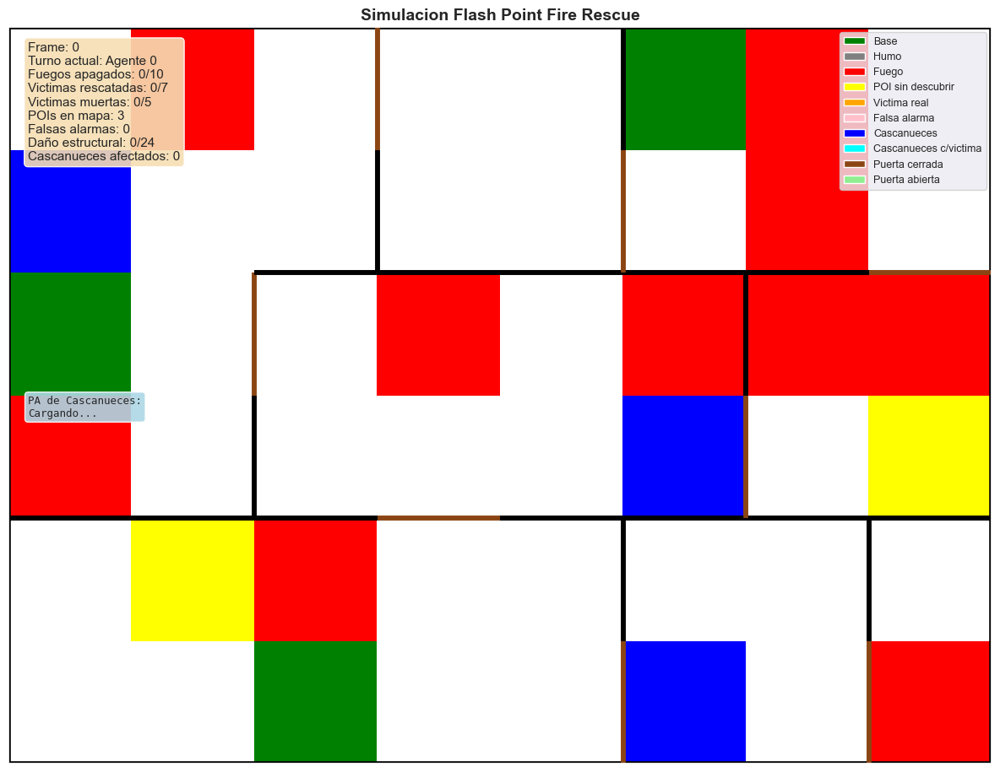

In [38]:
model_info = model.datacollector.get_model_vars_dataframe()
agent_info = model.datacollector.get_agent_vars_dataframe()

fig, axs = plt.subplots(figsize=(12, 10))
axs.set_xticks([])
axs.set_yticks([])
axs.set_title("Simulacion Flash Point Fire Rescue", fontsize=14, fontweight='bold')
colors = ['white', 'gray', 'red', 'yellow', 'orange', 'pink', 'blue', 'cyan', 'green']

n_bins = 9
cmap = matplotlib.colors.ListedColormap(colors[:n_bins])

patch = plt.imshow(model_info.iloc[0]['Grid'], cmap=cmap, vmin=0, vmax=8, origin='lower')

initial_walls = model_info.iloc[0]['Walls']
draw_walls(axs, initial_walls)

legend_elements = [
    Patch(facecolor='green', label='Base'),
    Patch(facecolor='gray', label='Humo'),
    Patch(facecolor='red', label='Fuego'),
    Patch(facecolor='yellow', label='POI sin descubrir'),
    Patch(facecolor='orange', label='Victima real'),
    Patch(facecolor='pink', label='Falsa alarma'),
    Patch(facecolor='blue', label='Cascanueces'),
    Patch(facecolor='cyan', label='Cascanueces c/victima'),
    Patch(facecolor='#8B4513', label='Puerta cerrada'),
    Patch(facecolor='#90EE90', label='Puerta abierta')
]

def animate(i):
    axs.clear()
    axs.set_xticks([])
    axs.set_yticks([])
    axs.set_title("Simulacion Flash Point Fire Rescue", fontsize=14, fontweight='bold')

    axs.imshow(model_info.iloc[i]['Grid'], cmap=cmap, vmin=0, vmax=8, origin='lower')

    current_walls = model_info.iloc[i]['Walls']
    draw_walls(axs, current_walls)

    axs.legend(handles=legend_elements, loc='upper right', bbox_to_anchor=(1.0, 1.0), fontsize=9)

    fuegos = model_info.iloc[i]['FuegosApagados']
    victimas_rescatadas = model_info.iloc[i]['VictimasRescatadas']
    victimas_mapa = model_info.iloc[i]['VictimasEnMapa']
    falsas_alarmas = model_info.iloc[i]['FalsasAlarmas']
    victimas_muertas = model_info.iloc[i]['VictimasMuertas']
    danio = model_info.iloc[i]['DanioEstructural']
    turno = model_info.iloc[i]['TurnoActual']
    cascanueces_afectados = model_info.iloc[i]['CascanuecesAfectados']

    step_info = axs.text(0.02, 0.98, '', transform=axs.transAxes,
                         fontsize=11, verticalalignment='top',
                         bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.9))

    step_info.set_text(
    f'Frame: {i}\n'
    f'Turno actual: Agente {turno}\n'
    f'Fuegos apagados: {fuegos}/10\n'
    f'Victimas rescatadas: {victimas_rescatadas}/{model.victimas_totales}\n'
    f'Victimas muertas: {victimas_muertas}/5\n'
    f'POIs en mapa: {victimas_mapa}\n'
    f'Falsas alarmas: {falsas_alarmas}\n'
    f'Daño estructural: {danio}/24\n'
    f'Cascanueces afectados: {cascanueces_afectados}'
)

    try:
        agent_data = agent_info.xs(i, level='Step')
        pa_info = "PA de Cascanueces:\n" + "=" * 30 + "\n"

        for agent_id in sorted(agent_data.index):
            pa = int(agent_data.loc[agent_id, 'PA'])
            fuegos_ag = int(agent_data.loc[agent_id, 'FuegosApagados'])
            humos_ag = int(agent_data.loc[agent_id, 'HumosApagados'])
            puertas_ag = int(agent_data.loc[agent_id, 'PuertasAbiertas'])
            veces_afectado = int(agent_data.loc[agent_id, 'VecesAfectado'])

            if agent_id == turno:
                pa_info += f"> Agente {agent_id}: PA={pa}/4 *\n"
            else:
                pa_info += f"  Agente {agent_id}: PA={pa}/4\n"
            pa_info += f"  Fuego:{fuegos_ag} Humo:{humos_ag} Puertas:{puertas_ag}"
            if veces_afectado > 0:
                pa_info += f" Explosiones:{veces_afectado}"
            pa_info += "\n"

        pa_stats = axs.text(0.02, 0.50, '', transform=axs.transAxes,
                            fontsize=9, verticalalignment='top', family='monospace',
                            bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.9))
        pa_stats.set_text(pa_info)
    except:
        pa_stats = axs.text(0.02, 0.50, '', transform=axs.transAxes,
                            fontsize=9, verticalalignment='top', family='monospace',
                            bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.9))
        pa_stats.set_text("PA de Cascanueces:\nCargando...")

anim = animation.FuncAnimation(fig, animate, frames=len(model_info),
                               interval=300, blit=False, repeat=True)

plt.tight_layout()


In [39]:
anim

In [40]:
NUM_RUNS = 100
MAX_STEPS = 200

results = []

for i in range(NUM_RUNS):
    model = FoodCollectionModel(
        width=8,
        height=6,
        num_agents=6,
    )

    steps = 0
    while not model.game_over() and steps < MAX_STEPS:
        model.step()
        steps += 1

    # Guardamos estadísticas de esta corrida
    results.append({
        "rescued": model.victims_rescued,
        "dead": model.victimas_muertas,
        "total_victims": model.victimas_totales,
        "fires_out": model.fuegos_totales_apagados,
        "false_alarms": model.falsas_alarmas_descubiertas,
        "damage": model.damage_count,
        "win": model.damage_count < 24 and model.victimas_muertas < 4
    })

print("Batch run terminado.")


Batch run terminado.


In [41]:
df = pd.DataFrame(results)

total_rescued = df["rescued"].sum()
total_dead = df["dead"].sum()
total_fires_out = df["fires_out"].sum()
total_false_alarms = df["false_alarms"].sum()
total_damage = df["damage"].sum()

wins = df["win"].sum()
winrate = wins / NUM_RUNS * 100

print("\n===== ESTADÍSTICAS TOTALES =====")
print(f"Víctimas rescatadas: {total_rescued}")
print(f"Víctimas muertas: {total_dead}")
print(f"Fuegos apagados: {total_fires_out}")
print(f"Falsas alarmas descubiertas: {total_false_alarms}")
print(f"Daño total acumulado: {total_damage}")
print(f"\nVictorias: {wins}/{NUM_RUNS}  ({winrate:.2f}%)")



===== ESTADÍSTICAS TOTALES =====
Víctimas rescatadas: 36
Víctimas muertas: 205
Fuegos apagados: 2466
Falsas alarmas descubiertas: 262
Daño total acumulado: 2431

Victorias: 0/100  (0.00%)


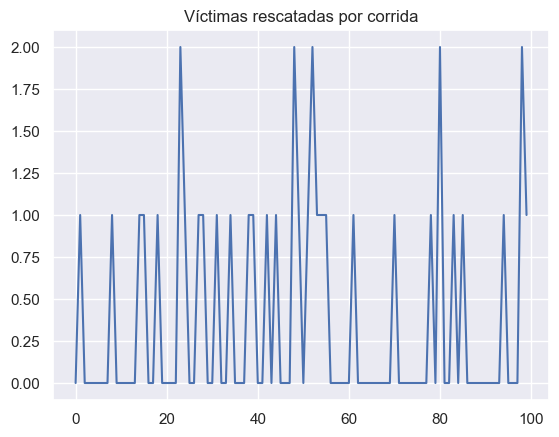

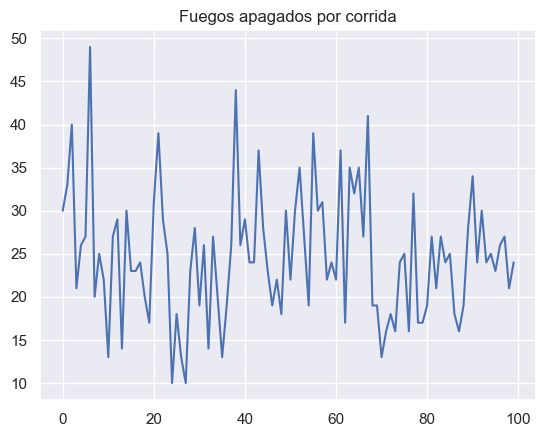

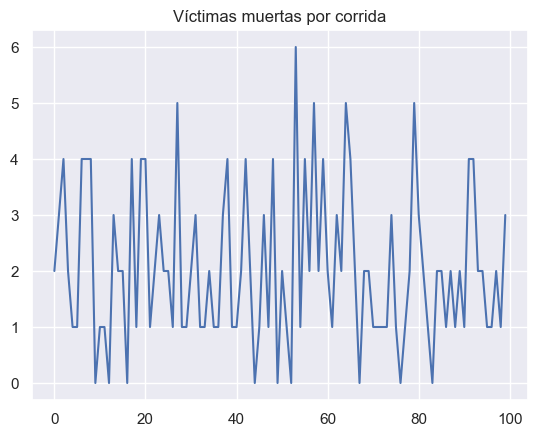

In [42]:
df["rescued"].plot(kind="line")
plt.title("Víctimas rescatadas por corrida")
plt.show()

df["fires_out"].plot(kind="line")
plt.title("Fuegos apagados por corrida")
plt.show()

df["dead"].plot(kind="line")
plt.title("Víctimas muertas por corrida")
plt.show()

In [ ]:
params = {"width":8, "height":6, "agents":6}

MAX_ITERATIONS = 10
MAX_STEPS = 500

results = batch_run(
    FoodCollectionModel,
    parameters=params,
    iterations=MAX_ITERATIONS,
    max_steps=MAX_STEPS,
    number_processes=1,
    data_collection_period=1,
    display_progress=True,
)